<a href="https://colab.research.google.com/github/headunderheels/GEOG-413/blob/main/02_visual-analysis-techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Lab 2: Visual Analysis Techniques**

**YOUR NAME** (Double-click cell to edit)

In [ ]:
from datetime import datetime

now = datetime.now()
print(f"Submitted time: {now}")

This lab follows tutorials from UTK's Dr. Qiusheng Wu using his Geemap Python package (You can find more information on his [website](https://geemap.org/).)

For those that are not familiar working with Python, here is a great [free course](https://codefinity.com/) and [free tutorials](https://www.learnpython.org/) to help you get more comfortable! These are not required, but I encourage you to give them a look, as it could help you in the course.

This lab  there are 4 Conceptual Questions (two per section) worth a total of 60% and 2 Challenge Questions (one per section) worth 40%.

## Requirements

Everytime you open a new notebook (or your kernel disconnects) you will need to run these requirements before you are able to produce any maps.

The 'pip install' lines are commented out becuase most everyone should already have these libraries installed on your devices, but in case you do not, uncomment and run the first two lines.

In [ ]:
# ! pip install geemap
# ! pip install pygis

import ee
import geemap
from geemap import basemaps

ee.Authenticate()
ee.Initialize(project='YOUR_PROJECT_NAME') # Replace 'YOUR_PROJECT_NAME' with the name of your earth engine cloud project

## Review Lab 1

In our previous lab, we learned how to utilize Google Earth Engine data and visualize images in both true-color and false-color with the Near-Infrared band. Additionally, we covered visualizing geometries (state and county boundaries) and preprocessing the data to better work for our needs (clipping our images to the geometries).

Let's recall the basics of the geemap structure:

([Geemap API](https://geemap.org/geemap/))

In [ ]:
review = geemap.Map()  # Define our map as 'review', which is case-sensitive.


## Filtering to a Single Image

collection = (
    ee.ImageCollection('COPERNICUS/S2_SR')                # defines Image Collection as Sentinel-2
    .filterDate('2020-01-01', '2021-01-01')               # filters the dates
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 5))   # only images with <5% cloud coverage
)

image = collection.median() # Choose the median image of the collection, leaving 1 image for our visualization


## Filtering US States to a Single State

state = (
    ee.FeatureCollection('TIGER/2018/States')             # defines Feature collection as TIGER US States
    .filter(ee.Filter.eq('STATEFP', '06'))                # filters to California
)


## Clip Image to State

image = image.clipToCollection(state) # Clips the image to the California


## Define Visualization Parameters

TCvis = (                             # Defines True-Color Visualization
    {'bands': ['B4', 'B3', 'B2'],
     'min': 0,
     'max': 2000,
     'gamma': 1.3}
)

FCvis = (                             # Defines False-Color Visualization
    {'bands': ['B8', 'B5', 'B4'],
     'min': 0,
     'max': 2000,
     'gamma': 1.3}
)


## Add Layers to Map

# MAP.addLayer({Image}, {Visualization Parameters}, {Layer Title})      <- General Layout
review.addLayer(image, TCvis, 'True Color')
review.addLayer(image, FCvis, 'False Color')
review.setCenter(-122.12, 37.51, 14)

## Display Map
review

Map(center=[37.51, -122.12], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchData…

## Graded Section

### Conceptual Questions (60%)

Your answers should be around 3-4 sentences to completely answer the question.

Question 1. How can legends and color bars help better orient the viewers of your maps? What might be lost if no legends or color bars are used? (15 points)

Question 2. In this week's lab we have worked with both vector (TIGER Census data, NLCD) and raster data (USGS SRTM, Terra Climate). Which type of dataset would be more suitable for a legend and which type would be more suited for a color bar, and why? (15 points)

Question 3. Go to the split-panel map from Part 2.1 and zoom in on Texas, near the southern border of the United States. As you slide between the years 2001 and 2019, what's the primary color you see more of in 2019? What does this mean? (15 Points)

Question 4. Describe a scenario (other than those covered in this lab) where a timeseries inspector map would be particularly beneficial. (15 points)

### Challenge Questions (40%)

Challenge 1 (20%): Using the [TIGER US Census Counties](https://developers.google.com/earth-engine/datasets/catalog/TIGER_2018_Counties) dataset, create a map of any state which includes


*   The 'HYBRID' Basemap instead of the default basemap
*   County Boundaries (change the border colors to anything but black)
*   County Labels (use the 'NAME' field for your labels)

You're also welcome to use this [FAO GAUL Dataset](https://developers.google.com/earth-engine/datasets/catalog/FAO_GAUL_2015_level2) if you would like to do this challenge, but for a country of your choosing! In that case, you should use the 'ADM2_NAME' field for your labels.





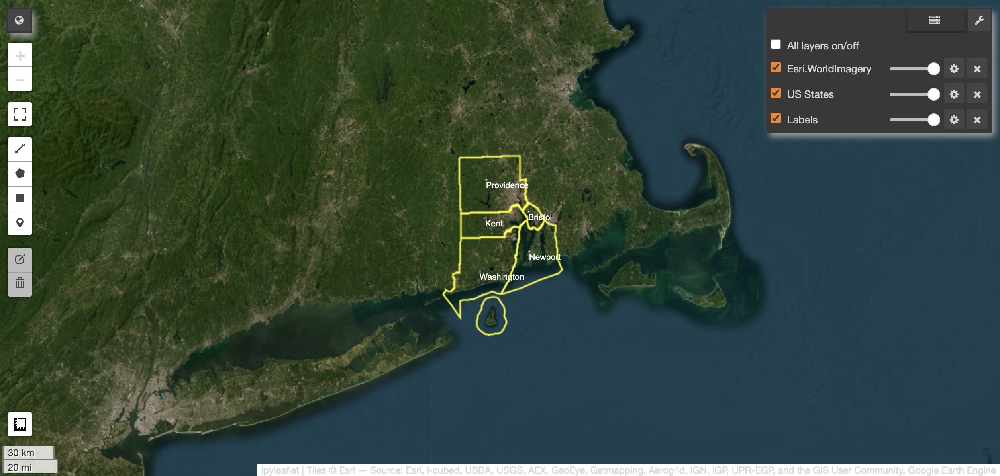

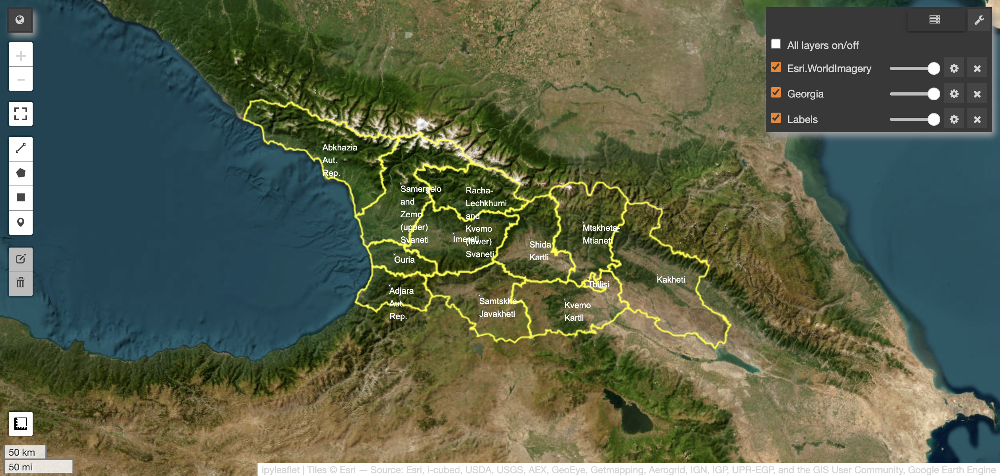

Challenge 2: Create a Timeseries Inspector using [Terra Climate](https://developers.google.com/earth-engine/datasets/catalog/IDAHO_EPSCOR_TERRACLIMATE#description) evapotrasiration data for a single year. Your dropbox options should be in monthly intervals (total of 12 options).  Include a color bar.

Your final map should look something like this:

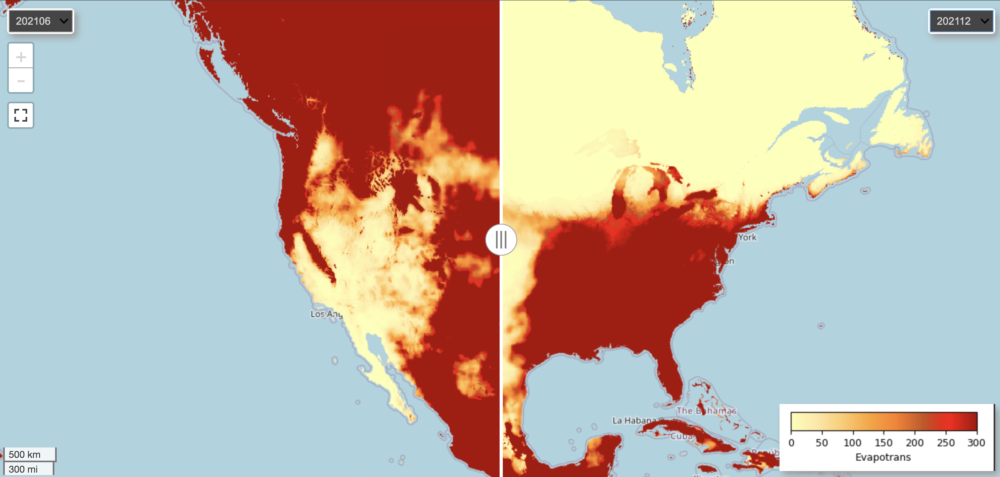

# Part 1: Legends, Color Bars, and Labels (Oh my!)

## 1.1 Creating legends

### 1.1.1 Built-in legends

Legends are important when you are trying to display data with multiple classes. Rather than manually designing a legend, Geemap has the ability to help automate that process.

Geemap has many legends imbedded in the API, ready for you to use. The code block below imports the 'builtin_legends' class and prints the name of each legend.

In [ ]:
from geemap.legends import builtin_legends

for legend in builtin_legends:
    print(legend)

NLCD
ESA_WorldCover
ESRI_LandCover
ESRI_LandCover_TS
Dynamic_World
NWI
MODIS/051/MCD12Q1
MODIS/006/MCD12Q1
GLOBCOVER
JAXA/PALSAR
Oxford
AAFC/ACI
COPERNICUS/CORINE/V20/100m
COPERNICUS/Landcover/100m/Proba-V/Global
USDA/NASS/CDL
ALOS_landforms


In [ ]:
# Define map as 'built'
built = geemap.Map(center=[40, -100], zoom=4)

In [ ]:
# Add a different basemap than the regular Open Street Maps
built.add_basemap('HYBRID')

# Define your image as 'nlcd'
nlcd = ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019')
landcover = nlcd.select('landcover')    # Select the Landcover Class

# Add the landcover to the map
built.addLayer(
    landcover,                # Image
     {},                      # The visualization parameters are blank because we are using default
    'NLCD Land Cover 2019'    # Layer Title
)

# Add a legend to the map
built.add_legend(
    title="NLCD Land Cover Classification",   # Layer Title
    builtin_legend='NLCD',                    # Define which built-in legend you want to use
    height='465px'                            # Size of legend
)

# Display the map
built

Map(center=[40, -100], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(ch…

### 1.1.2 Custom legends

If the built-in legends do not work for your map, you can create your own legend! All you need to do is define your label names and color for each label.

In [ ]:
Custom = geemap.Map(add_google_map=False)

labels = ['One', 'Two', 'Three', 'Four', 'etc']

# colors can be defined using either hex code or RGB (0-255, 0-255, 0-255)
colors = ['#8DD3C7', '#FFFFB3', '#BEBADA', '#FB8072', '#80B1D3']


Custom.add_legend(
    labels=labels,
    colors=colors,
    position='bottomright'
)

Custom

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

## 1.2 Creating color bars

Sometimes a discreet legend, with completely separate classes, is not realistic for a dataset. In that instance, it may be helpful to have a gradient, which can be achieved with a color bar.

In [ ]:
bar = geemap.Map()
dem = ee.Image('USGS/SRTMGL1_003')
DEMvis = {
    'min': 0,       # Minimum value for your data
    'max': 4000,    # Maximum value for your data
    'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5'],  # Define your color palette
}                                                                   # Note: The # of colors used determines your # of classes

bar.addLayer(
    dem,          # Image
    DEMvis,   # Visualization parameters
    'SRTM DEM'    # Layer title
)

bar   # Display map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [ ]:
bar.add_colorbar(
    DEMvis,                 # Visualization parameters
    label="Elevation (m)",  # Label for the color bar
    layer_name="SRTM DEM"   # Layer title
)

In [ ]:
bar.add_colorbar(
    DEMvis,                 # Visualization parameters
    label="Elevation (m)",  # Label for the color bar
    layer_name="SRTM DEM",  # Layer title
    orientation="vertical"  # Orientation of the color bar
)

## 1.3 Displaying labels

In [ ]:
# Define Labels Map
labels = geemap.Map(center=[40, -100], zoom=4)

# Add a different basemap than the regular Open Street Maps
labels.add_basemap('HYBRID')

# Define Feature Collection
states = ee.FeatureCollection("TIGER/2018/States")

# Custom Visualization Parameters
style = {'color': 'black', 'fillColor': "00000000"}

# Add Layer to Map
labels.addLayer(
    states.style(**style),  # Image (styled with our custom parameters)
     {},                    # Leave blank
    "US States"             # Layer Title
)

# Display Map
labels

Map(center=[40, -100], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(ch…

In [ ]:
labels.add_labels(
    data=states,          # Define dataset
    column="STUSPS",      # Define which field to use as labels
    font_size="12pt",
    font_color="red",
    font_family="arial",
    font_weight="bold",
)

In [ ]:
labels.remove_labels()  # Removes labels from map

However, not every dataset you will use will automatically know where to place your labels. The TIGER dataset has a default for this

Since our data is in vector format (states are polygons), we can find the center of each state by applying the 'geemap.vector_centroids()' function to our states variable. This will add two new columns, one for longitude and one for latitude. To make sure these properties were added, we will display the dataset by simply typing the variable.

In [ ]:
centroids = geemap.vector_centroids(states)   # Apply function to dataset
centroids  # Display dataset

### 1.3.1 Converting Earth Engine Assets to Dataframes

NOTE: YOU WILL NOT NEED THIS CONCEPT FOR YOUR CHALLENGE QUESTION!

Since it is difficult to view all the information in our dataset in this layout, we can convert it to a dataframe (df), which will be much easier to view, by applying the 'geemap.ee_to_df()' function. This will put our data in nice, neat rows and columns that are easy to interpret.

Notice that the centroid coordinates are in the last two columns!

In [ ]:
df = geemap.ee_to_df(centroids)
df

,ALAND,AWATER,DIVISION,FUNCSTAT,GEOID,INTPTLAT,INTPTLON,LSAD,MTFCC,NAME,REGION,STATEFP,STATENS,STUSPS,latitude,longitude
0,348021896,1550236201,0,A,78,+18.3267480,-064.9712508,00,G4000,United States Virgin Islands,9,78,01802710,VI,18.059360,-64.838759
1,472292529,4644252461,0,A,69,+14.9367835,+145.6010210,00,G4000,Commonwealth of the Northern Mariana Islands,9,69,01779809,MP,16.796171,145.597019
2,543555840,934337453,0,A,66,+13.4382886,+144.7729493,00,G4000,Guam,9,66,01802705,GU,13.442713,144.769378
3,197759063,1307243754,0,A,60,-14.2671590,-170.6682674,00,G4000,American Samoa,9,60,01802701,AS,-13.963954,-170.082423
4,8868896030,4922382562,0,A,72,+18.2176480,-066.4107992,00,G4000,Puerto Rico,9,72,01779808,PR,18.216460,-66.414736
5,2677779902,1323670487,1,A,44,+41.5974187,-071.5272723,00,G4000,Rhode Island,1,44,01219835,RI,41.594008,-71.524721
6,23189413166,1026675248,1,A,33,+43.6726907,-071.5843145,00,G4000,New Hampshire,1,33,01779794,NH,43.673858,-71.573904
7,23874175944,1030416650,1,A,50,+44.0685773,-072.6691839,00,G4000,Vermont,1,50,01779802,VT,44.069271,-72.666063
8,12542497068,1815617571,1,A,09,+41.5798637,-072.7466572,00,G4000,Connecticut,1,09,01779780,CT,41.575119,-72.739322
9,79887426037,11746549764,1,A,23,+45.4092843,-068.6666160,00,G4000,Maine,1,23,01779787,ME,45.260848,-69.213836


In [ ]:
labels.add_labels(
    data=df,              # Dataset
    column="STUSPS",      # Column for labels
    font_size="12pt",
    font_color="blue",
    font_family="arial",
    font_weight="bold",
    x='longitude',        # column for x-coordinate of centroid
    y='latitude',         # column for y-coordinate of centroid
)

labels

Map(center=[40, -100], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(ch…

# Part 2: Interactive Maps


## 2.1 Split-panel maps

In [ ]:
# Initialize the map
split = geemap.Map(center=(40, -100), zoom=4, height=600)

# Load NLCD data
nlcd_2001 = ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2001').select('landcover')
nlcd_2019 = ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').select('landcover')

# Create tile layers
left_layer = geemap.ee_tile_layer(nlcd_2001, {}, 'NLCD 2001')
right_layer = geemap.ee_tile_layer(nlcd_2019, {}, 'NLCD 2019')

# Split map view
split.split_map(left_layer, right_layer, add_close_button=True)

# Define legend keys and colors
legend_keys = ['Urban', 'Water', 'Developed', 'Barren', 'Forest', 'Shrubland', 'Herbaceous', 'Planted/Cultivated', 'Wetlands']
legend_colors = ['#eb0000', '#476ba1', '#d1defa', '#decaca', '#a9c0a6', '#b5a76f', '#f1e2cc', '#e2e2c6', '#c8d7d4']

# Add legend to the map
split.add_legend(title='NLCD Land Cover', labels=legend_keys, colors=legend_colors)

# Display the map
split

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

## 2.2 Timeseries Inspector

In [ ]:
# Intialize the map
time = geemap.Map(center=[40, -100], zoom=4)

# Define image collection and
collection = (
    ee.ImageCollection('USGS/NLCD_RELEASES/2019_REL/NLCD')
    .select('landcover')    # Must specifically call on this band
)

# Visualization parameters
vis_params = {'bands': ['landcover']}   # There are already color codes specific to each band, so apply those

# Function to display the available years
years = collection.aggregate_array('system:index').getInfo()
years

['2001', '2004', '2006', '2008', '2011', '2013', '2016', '2019']

In [ ]:
time.ts_inspector(
    left_ts=collection,     # Left-side dataset
    right_ts=collection,    # Right-side dataset
    left_names=years,       # Dropbox options list (Left)
    right_names=years,      # Dropbox options list (Right)
    left_vis=vis_params,    # Visualization parameters (Left)
    right_vis=vis_params,   # Visualization parameters (Right)
    width='80px',           # Dropbox size
)
time

Map(center=[40, -100], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Dropdown(layout=…

In [ ]:
time.add_legend(
    title="NLCD Land Cover Classification",   # Layer Title
    builtin_legend='NLCD',                    # Define which built-in legend you want to use
    height='465px'                            # Size of legend
)